## Advanced Lane Lines

The goal of this project is :
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position in a video.

and the steps of this project are the following:
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images. Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [11]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle

%matplotlib inline
#%matplotlib qt4 

## Camera Calibration

In [15]:
# read in and make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg' )

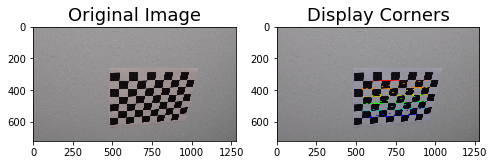

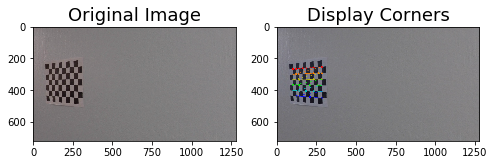

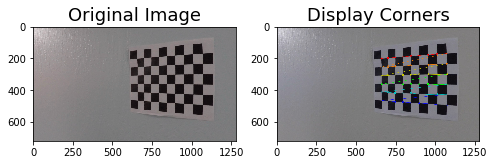

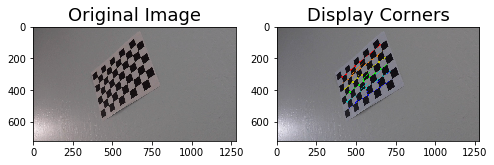

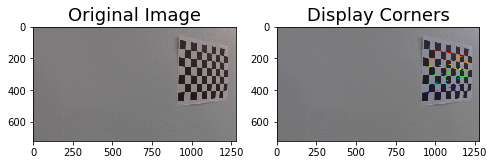

...

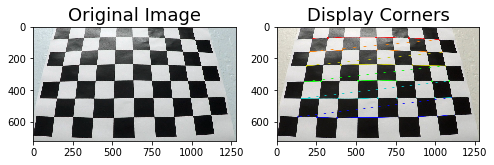

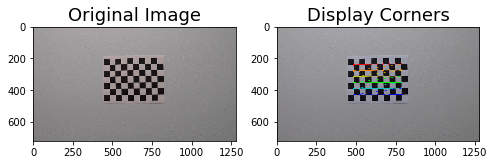

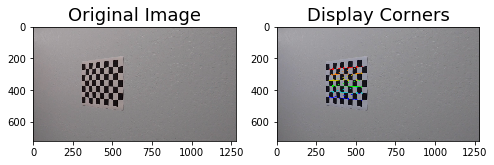

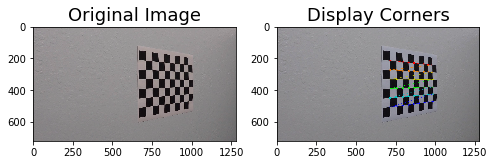

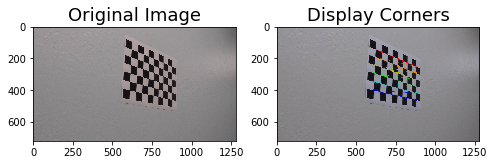

In [17]:
# prepare object points
nx=9
ny=6
#arrays to store object points and image points from all images
objpoints = [] #3D points in real world space
imgpoints = [] #2D points in image plane

#prepare object points like (0,0,0)  (1,0,0), (2,0,0),... (7,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2]= np.mgrid[0:nx,0:ny].T.reshape(-1,2) #x,y coordinates

for fname in images:
    #read image
    img = cv2.imread(fname)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    #print(ret)
    # If found, draw corners
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=18)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Display Corners', fontsize=18)

In [30]:
def cal_undistort(img, show=True):
    img = cv2.imread(img)
    # img.shape[0:2] for color image
    # gray.shape[::-1] for grayscale image
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    if show:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=50)
        ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax2.set_title('Undistorted Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    return undist



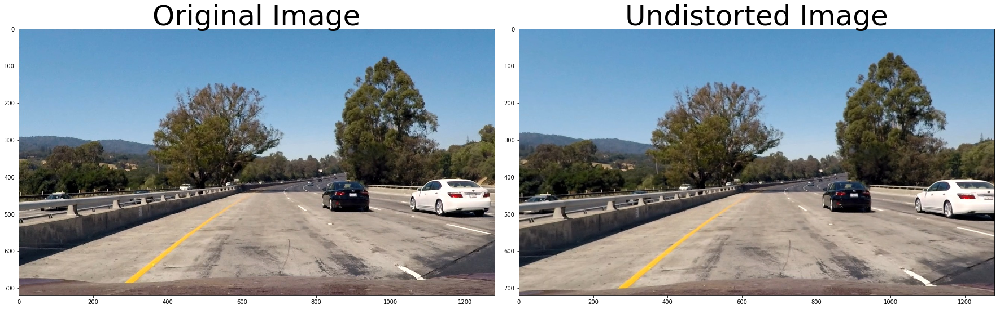

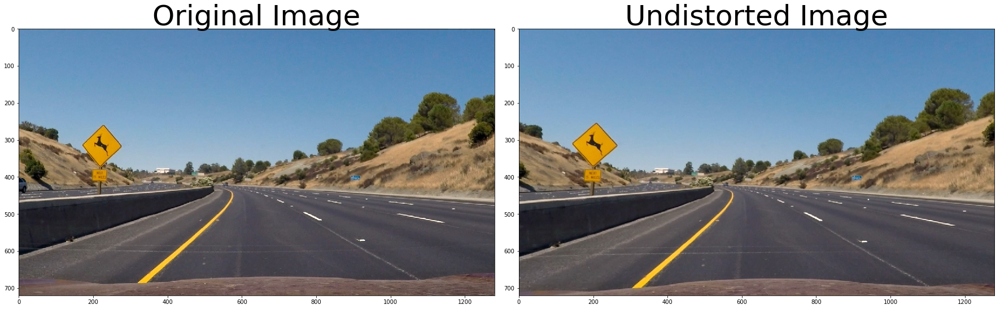

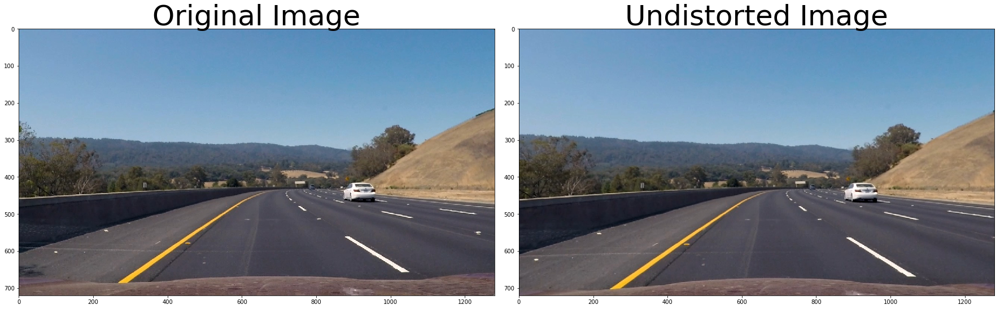

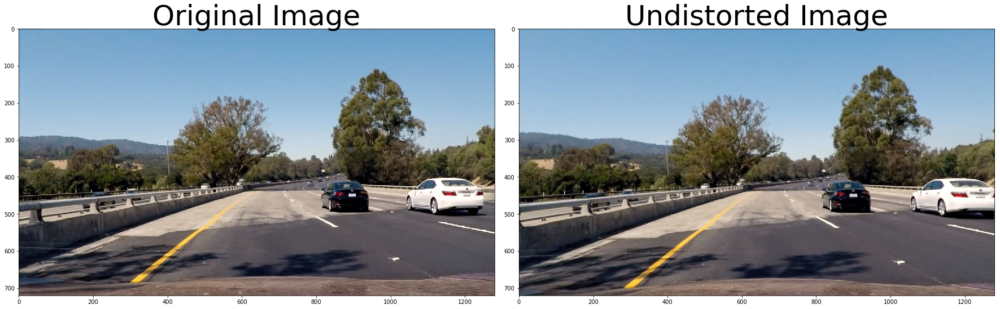

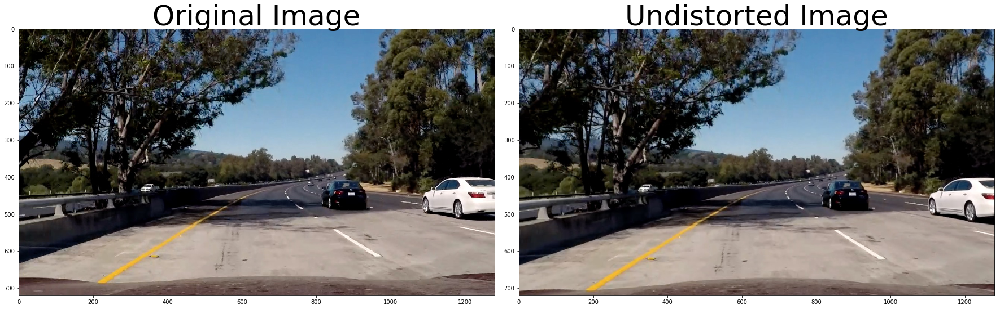

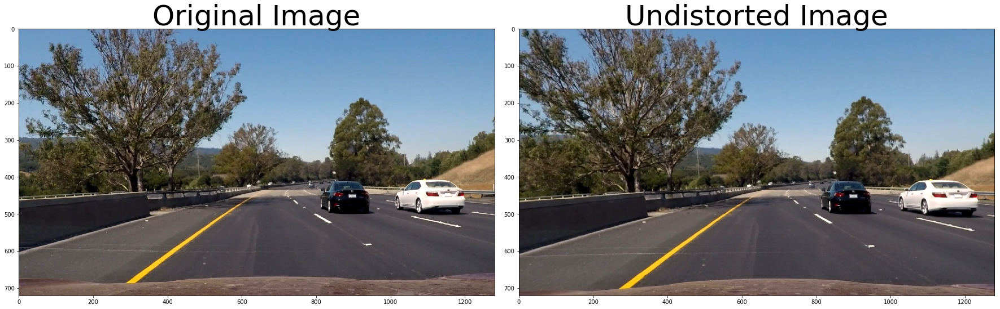

In [31]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    cal_undistort(image)